In [1]:
import pandas as pd
import numpy as np
from scipy.stats import chi2_contingency , f_oneway, ttest_ind
from colorama import Fore, Back, Style

import plotly.express as px
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

# Configurar visualização dos dados
pd.set_option('display.float_format', lambda x: '%.3f' % x)
np.set_printoptions(suppress=True, precision=3)

from catboost import CatBoostClassifier, Pool
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.multiclass import OneVsOneClassifier, OneVsRestClassifier
from sklearn.metrics import classification_report, confusion_matrix,ConfusionMatrixDisplay, log_loss, roc_curve, roc_auc_score

import shap

/home/orlandojunior/miniconda3/envs/rocketseat_ia/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Carregar os dados

In [2]:
df_movies = pd.read_csv('./movies.csv')

In [3]:
df_movies.info()

<class 'pandas.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   duration_minutes    2000 non-null   int64  
 1   cast_count          2000 non-null   int64  
 2   has_superstars      2000 non-null   int64  
 3   explosions_count    2000 non-null   int64  
 4   music_style         2000 non-null   str    
 5   director_fame       2000 non-null   str    
 6   dialogue_density    2000 non-null   float64
 7   has_romantic_scene  2000 non-null   int64  
 8   humor_level         2000 non-null   float64
 9   violence_level      2000 non-null   float64
 10  is_comedy           2000 non-null   int64  
 11  is_action           2000 non-null   int64  
 12  is_romance          2000 non-null   int64  
dtypes: float64(3), int64(8), str(2)
memory usage: 203.3 KB


In [4]:
df_movies.head()

,duration_minutes,cast_count,has_superstars,explosions_count,music_style,director_fame,dialogue_density,has_romantic_scene,humor_level,violence_level,is_comedy,is_action,is_romance
0,131,3,0,4,pop,low,5.390,0,5.980,8.080,0,1,0
1,172,9,0,0,electronic,low,2.880,1,3.680,1.910,0,0,0
2,94,12,0,2,pop,medium,3.170,1,7.050,8.470,1,1,1
3,151,14,1,2,acoustic,medium,2.640,1,7.410,0.580,1,0,0
4,140,18,1,0,jazz,medium,4.540,0,6.970,0.060,0,0,0


## EDA

In [5]:
colunas_caregoricas = df_movies.select_dtypes(include=['str']).columns

for col in colunas_caregoricas:
    print(f'\nColuna: {col} possui os seguintes valores {df_movies[col].unique()}')


Coluna: music_style possui os seguintes valores <StringArray>
['pop', 'electronic', 'acoustic', 'jazz', 'orchestral']
Length: 5, dtype: str

Coluna: director_fame possui os seguintes valores <StringArray>
['low', 'medium', 'high']
Length: 3, dtype: str


In [6]:
targets = ['is_comedy','is_action','is_romance']
colunas_numericas = df_movies.select_dtypes(include=['number']).columns

for feature in targets:

    for col in colunas_numericas:

        fig = px.histogram(df_movies.value_counts(col), x=df_movies[col], y=df_movies[feature], title=f'Distribuição {col} por {feature}')
        fig.show()



In [7]:
for col in targets:
    df_count = df_movies[col].value_counts().reset_index()
    df_count.columns = ['categoria','contagem']

    fig = px.bar(df_count,
                 x='categoria',
                 y='contagem',
                 title=f'Distribuição/Contagem de {col}',
                 color='categoria')
    fig.show()

In [8]:

for target in targets:

    for col in colunas_numericas:
        fig = px.box(df_movies, x=target,color=target, y=col, title=f'{col} por {target}')
        fig.show()
    
    for col in colunas_caregoricas:
        fig = px.histogram(df_movies, x=col,color=target, barmode='group', title=f'{col} por {target}')
        fig.show()

In [9]:
corr_matrix = df_movies[colunas_numericas].corr()

# Heatmap da matriz 

fig = px.imshow(
    corr_matrix,
    color_continuous_scale='armyrose',
    title='Matriz de Correlação',
    zmin=-1,
    zmax=1,
)

# Ajustes no heatmap

fig.update_traces(text=corr_matrix, texttemplate='%{text:.1%}', textfont=dict(size=9))

fig.update_layout(
    width=1000,
    height=600,
    title_font=dict(size=14),
    font=dict(size =10)
)

fig.show()

In [10]:
# ANOVA - Análise de Variância (Diferença significativa média entre 3 ou mais grupos)
# Teste T-Student - (Diferença significativa média entre 2 grupos)

for col in colunas_numericas:

    for target in targets:

        groups = [df_movies[df_movies[target] == val][col] for val in df_movies[target].unique()]

        if df_movies[target].nunique() <= 2:

            stat, p = ttest_ind(*groups)
            teste = 'T-Test'

        elif df_movies[target].nunique() > 2:

            stat, p = f_oneway(*groups)
            teste = 'ANOVA'
            
        print(f'{Fore.RED if p < 0.05 else Fore.WHITE}'
                  f'T-Teste entre {col} e {target}: p-valor ={p}')
        

T-Teste entre duration_minutes e is_comedy: p-valor =0.16577994126722234
T-Teste entre duration_minutes e is_action: p-valor =0.3049882609458758
T-Teste entre duration_minutes e is_romance: p-valor =0.7030937169995385
T-Teste entre cast_count e is_comedy: p-valor =0.045248308869544805
T-Teste entre cast_count e is_action: p-valor =0.4927942258671001
T-Teste entre cast_count e is_romance: p-valor =0.06585724614826002
T-Teste entre has_superstars e is_comedy: p-valor =0.585914079776411
T-Teste entre has_superstars e is_action: p-valor =0.17159014996581212
T-Teste entre has_superstars e is_romance: p-valor =0.5668327957085191
T-Teste entre explosions_count e is_comedy: p-valor =0.8923356294347246
T-Teste entre explosions_count e is_action: p-valor =0.58862458896138
T-Teste entre explosions_count e is_romance: p-valor =0.7680200150760765
T-Teste entre dialogue_density e is_comedy: p-valor =0.6469629120096109
T-Teste entre dialogue_density e is_action: p-valor =0.4872127716648712
T-Teste en

/home/orlandojunior/miniconda3/envs/rocketseat_ia/lib/python3.12/site-packages/scipy/stats/_axis_nan_policy.py:592: RuntimeWarning:

Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.



## Preparação dos dados

In [11]:
df_movies.info()

<class 'pandas.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   duration_minutes    2000 non-null   int64  
 1   cast_count          2000 non-null   int64  
 2   has_superstars      2000 non-null   int64  
 3   explosions_count    2000 non-null   int64  
 4   music_style         2000 non-null   str    
 5   director_fame       2000 non-null   str    
 6   dialogue_density    2000 non-null   float64
 7   has_romantic_scene  2000 non-null   int64  
 8   humor_level         2000 non-null   float64
 9   violence_level      2000 non-null   float64
 10  is_comedy           2000 non-null   int64  
 11  is_action           2000 non-null   int64  
 12  is_romance          2000 non-null   int64  
dtypes: float64(3), int64(8), str(2)
memory usage: 203.3 KB


In [12]:
X = df_movies.drop(columns=targets)
y= df_movies[targets]

In [13]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.5,random_state=51, shuffle=True)

In [14]:
print(f"Classes únicas no treino: {np.unique(y_train)}")
print(f"Formato do y_train: {y_train.shape}")

Classes únicas no treino: [0 1]
Formato do y_train: (1000, 3)


## Treinamento do modelo

In [15]:
# Criar o objeto Catboost
cat_model = CatBoostClassifier(
    iterations=1000,
    learning_rate=0.05,
    depth=6,
    l2_leaf_reg=3,
    cat_features=colunas_caregoricas.tolist(),
    random_strength=2,
    loss_function='Logloss'
)

In [16]:
ovr_model = OneVsRestClassifier(cat_model)

In [17]:
ovr_model.fit(X_train, y_train)

0:	learn: 0.6156083	total: 62.2ms	remaining: 1m 2s
1:	learn: 0.5219384	total: 64.4ms	remaining: 32.1s
2:	learn: 0.4488972	total: 75.2ms	remaining: 25s
3:	learn: 0.4034958	total: 78.1ms	remaining: 19.5s
4:	learn: 0.3676629	total: 81ms	remaining: 16.1s
5:	learn: 0.3252589	total: 82.7ms	remaining: 13.7s
6:	learn: 0.2880404	total: 83.6ms	remaining: 11.9s
7:	learn: 0.2512712	total: 84.7ms	remaining: 10.5s
8:	learn: 0.2201087	total: 85.6ms	remaining: 9.42s
9:	learn: 0.2087806	total: 86.1ms	remaining: 8.52s
10:	learn: 0.1912627	total: 87.6ms	remaining: 7.88s
11:	learn: 0.1785856	total: 88.9ms	remaining: 7.32s
12:	learn: 0.1631750	total: 89.5ms	remaining: 6.79s
13:	learn: 0.1537717	total: 90.8ms	remaining: 6.39s
14:	learn: 0.1463315	total: 91.8ms	remaining: 6.03s
15:	learn: 0.1384521	total: 92.9ms	remaining: 5.71s
16:	learn: 0.1321401	total: 93.7ms	remaining: 5.42s
17:	learn: 0.1285501	total: 95.5ms	remaining: 5.21s
18:	learn: 0.1237075	total: 96.4ms	remaining: 4.98s
19:	learn: 0.1203194	total

OneVsRestClassifier(estimator=<catboost.core.CatBoostClassifier object at 0x7738e03541d0>)

## Análise dos resultados e métricas

In [18]:
y_pred = ovr_model.predict(X_test)
y_pred.shape

(1000, 3)

In [19]:
y_pred

array([[0, 0, 0],
       [0, 1, 1],
       [0, 1, 0],
       ...,
       [0, 0, 0],
       [1, 1, 0],
       [0, 0, 0]], shape=(1000, 3))

In [20]:
y_pred_proba = ovr_model.predict_proba(X_test)
y_pred_proba

array([[0.   , 0.   , 0.   ],
       [0.   , 0.996, 0.826],
       [0.   , 0.995, 0.001],
       ...,
       [0.   , 0.001, 0.   ],
       [0.991, 0.961, 0.   ],
       [0.   , 0.   , 0.   ]], shape=(1000, 3))

In [21]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.88      0.99      0.93       287
           1       0.88      1.00      0.93       253
           2       0.81      0.95      0.87       183

   micro avg       0.86      0.98      0.92       723
   macro avg       0.86      0.98      0.91       723
weighted avg       0.86      0.98      0.92       723
 samples avg       0.53      0.55      0.54       723



/home/orlandojunior/miniconda3/envs/rocketseat_ia/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.

/home/orlandojunior/miniconda3/envs/rocketseat_ia/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning:

Recall is ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.

/home/orlandojunior/miniconda3/envs/rocketseat_ia/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in samples with no true nor predicted labels. Use `zero_division` parameter to control this behavior.



## Tuning de hiperparâmetros

In [22]:
param_grid = {
    "iterations" : [100,200],
    "learning_rate":[0.01,0.05],
    "depth": [3,6,8],
    "l2_leaf_reg": [1,3,5],
    "border_count":[32,64,128]
}

In [23]:
base_model = CatBoostClassifier(
    random_state=51, 
    loss_function='Logloss', 
    cat_features=colunas_caregoricas.tolist(),
)

ovr_estimator = OneVsRestClassifier(base_model)

folds = KFold(n_splits=5, shuffle=True, random_state=51)
param_grid_ovr = {f'estimator__{k}': v for k, v in param_grid.items()}

grid_search = GridSearchCV(
    estimator=ovr_estimator, 
    param_grid=param_grid_ovr, 
    cv=folds
)


In [24]:
grid_search.fit(X_train,y_train)

0:	learn: 0.6845688	total: 396us	remaining: 39.3ms
1:	learn: 0.6761505	total: 3.74ms	remaining: 183ms
2:	learn: 0.6685446	total: 4.76ms	remaining: 154ms
3:	learn: 0.6608704	total: 5.07ms	remaining: 122ms
4:	learn: 0.6537834	total: 5.36ms	remaining: 102ms
5:	learn: 0.6459578	total: 5.77ms	remaining: 90.4ms
6:	learn: 0.6386315	total: 6.21ms	remaining: 82.6ms
7:	learn: 0.6310993	total: 6.67ms	remaining: 76.7ms
8:	learn: 0.6237249	total: 6.92ms	remaining: 69.9ms
9:	learn: 0.6170184	total: 7.17ms	remaining: 64.5ms
10:	learn: 0.6099003	total: 7.37ms	remaining: 59.6ms
11:	learn: 0.6029379	total: 7.56ms	remaining: 55.4ms
12:	learn: 0.5961025	total: 7.86ms	remaining: 52.6ms
13:	learn: 0.5893722	total: 8.09ms	remaining: 49.7ms
14:	learn: 0.5827651	total: 8.29ms	remaining: 47ms
15:	learn: 0.5761912	total: 8.48ms	remaining: 44.5ms
16:	learn: 0.5698255	total: 9.97ms	remaining: 48.7ms
17:	learn: 0.5635275	total: 10.2ms	remaining: 46.6ms
18:	learn: 0.5573350	total: 10.5ms	remaining: 44.7ms
19:	learn:

/home/orlandojunior/miniconda3/envs/rocketseat_ia/lib/python3.12/site-packages/numpy/ma/core.py:2896: RuntimeWarning:

invalid value encountered in cast



2:	learn: 0.4595023	total: 7.99ms	remaining: 525ms
3:	learn: 0.3865018	total: 9.31ms	remaining: 456ms
4:	learn: 0.3514470	total: 10.6ms	remaining: 413ms
5:	learn: 0.3100646	total: 13.2ms	remaining: 427ms
6:	learn: 0.2853165	total: 15.2ms	remaining: 419ms
7:	learn: 0.2492781	total: 16.2ms	remaining: 389ms
8:	learn: 0.2271108	total: 18.1ms	remaining: 384ms
9:	learn: 0.2101715	total: 19.8ms	remaining: 376ms
10:	learn: 0.1881073	total: 20.7ms	remaining: 356ms
11:	learn: 0.1717877	total: 21.6ms	remaining: 338ms
12:	learn: 0.1607894	total: 23ms	remaining: 331ms
13:	learn: 0.1493817	total: 24ms	remaining: 318ms
14:	learn: 0.1437825	total: 25.7ms	remaining: 317ms
15:	learn: 0.1380677	total: 27.6ms	remaining: 317ms
16:	learn: 0.1336351	total: 29.4ms	remaining: 316ms
17:	learn: 0.1269150	total: 30.3ms	remaining: 307ms
18:	learn: 0.1228560	total: 32.1ms	remaining: 306ms
19:	learn: 0.1178742	total: 34.7ms	remaining: 312ms
20:	learn: 0.1146105	total: 36.6ms	remaining: 312ms
21:	learn: 0.1117138	tot

GridSearchCV(cv=KFold(n_splits=5, random_state=51, shuffle=True),
             estimator=OneVsRestClassifier(estimator=<catboost.core.CatBoostClassifier object at 0x7738e0355c70>),
             param_grid={'estimator__border_count': [32, 64, 128],
                         'estimator__depth': [3, 6, 8],
                         'estimator__iterations': [100, 200],
                         'estimator__l2_leaf_reg': [1, 3, 5],
                         'estimator__learning_rate': [0.01, 0.05]})

In [25]:
grid_search.best_params_

{'estimator__border_count': 128,
 'estimator__depth': 8,
 'estimator__iterations': 200,
 'estimator__l2_leaf_reg': 5,
 'estimator__learning_rate': 0.05}

In [26]:
best_model = grid_search.best_estimator_

In [27]:
y_pred_tuned = best_model.predict(X_test)
y_pred_tuned

array([[0, 0, 0],
       [0, 1, 1],
       [0, 1, 0],
       ...,
       [0, 0, 0],
       [1, 1, 0],
       [0, 0, 0]], shape=(1000, 3))

In [28]:
y_pred_proba = best_model.predict(X_test)
y_pred_proba

array([[0, 0, 0],
       [0, 1, 1],
       [0, 1, 0],
       ...,
       [0, 0, 0],
       [1, 1, 0],
       [0, 0, 0]], shape=(1000, 3))

In [29]:
print(classification_report(y_test,y_pred_tuned))

              precision    recall  f1-score   support

           0       0.88      1.00      0.94       287
           1       0.88      1.00      0.93       253
           2       0.81      0.98      0.89       183

   micro avg       0.86      0.99      0.92       723
   macro avg       0.86      0.99      0.92       723
weighted avg       0.86      0.99      0.92       723
 samples avg       0.53      0.56      0.54       723



/home/orlandojunior/miniconda3/envs/rocketseat_ia/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.

/home/orlandojunior/miniconda3/envs/rocketseat_ia/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning:

Recall is ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.

/home/orlandojunior/miniconda3/envs/rocketseat_ia/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in samples with no true nor predicted labels. Use `zero_division` parameter to control this behavior.




Matriz de confusão para is_comedy


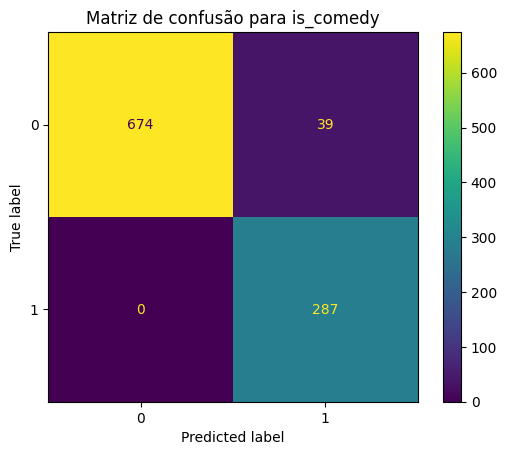


Matriz de confusão para is_action


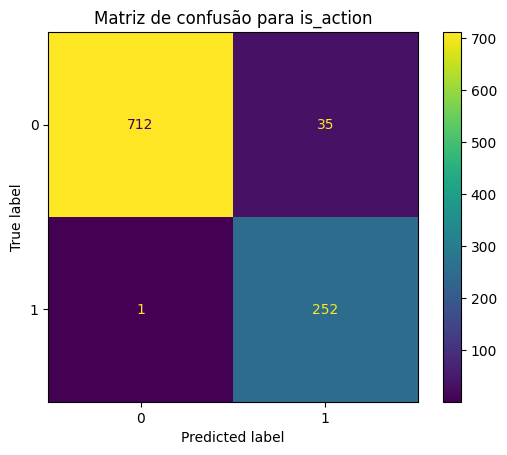


Matriz de confusão para is_romance


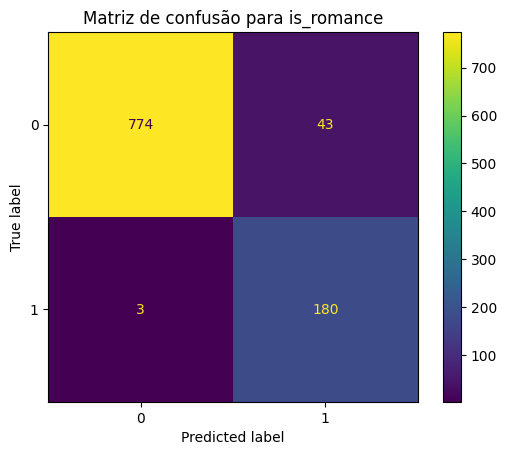

In [30]:
# Mostrar a matriz de confusão para cada classe

for i, target in enumerate(targets):
    print(f'\nMatriz de confusão para {target}')
    conf_matrix = confusion_matrix(y_test.iloc[:,i],y_pred_tuned[:,i])

    fig = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=[0,1])
    fig.plot()
    plt.title(f'Matriz de confusão para {target}')
    plt.show()

In [31]:
# Calcular o logloss para cada target
print('Log Loss por Target')

for i, target in enumerate(targets):
    log_loss_score = log_loss(y_test.iloc[:,i], y_pred_proba[:,i])

    print(f'{target} : {log_loss_score:.4f}')

Log Loss por Target
is_comedy : 1.4057
is_action : 1.2976
is_romance : 1.6580


In [32]:


for i, target in enumerate(targets):

    importancias = ovr_model.estimators_[i].feature_importances_
    nomes_features = X.columns.tolist()

    df_importances = pd.DataFrame({'feature': nomes_features, 'importancia': importancias})

    df_importances = df_importances.sort_values(by='importancia', ascending=False).reset_index(drop=True)

    fig = px.bar(
        df_importances.head(10),
        x='importancia',
        y='feature',
        orientation='h',
        title=f'Importancia das 10 principais features - {target}',
        labels={'importancia': 'Importância', 'feature': 'Feature'},
        color='importancia',
        color_continuous_scale='ArmyRose'
    )

    fig.update_layout(
        height=600,
        yaxis={'categoryorder': 'total ascending'}
    )

    fig.show()